In [1]:
from sklearnex import patch_sklearn
patch_sklearn()


Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


In [2]:
# import libraries
import tensorflow as tf

2023-04-08 05:38:43.491629: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [3]:

from tensorflow.keras import models, layers
import matplotlib.pyplot as plt
import numpy as np
import pathlib
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2' # to disable all debugging logs

In [4]:
# importing dataset
dir = os.listdir()
for filenames in dir:
    print(filenames)

Untitled1.ipynb
Tomato_Leaf_Mold
mandelbrot
.bash_profile.bak2
tp
MPI_with_OpenMP_or_DPCPP
.ssh
tmp
OpenMP_Offload
.bash_profile.bak
xpublog
.jupyter
Tomato_Late_blight
Marketvis.ipynb
.keras
Tomato_Early_blight
Untitled4.ipynb
.bashrc
.ipython
RenderKit_Learning_Path
Tomato__Tomato_mosaic_virus
Untitled2.ipynb
.bash_history
logs.log
Untitled.ipynb
datasets
.ipynb_checkpoints
.bash_profile
LossVal_loss.png
.bash_logout
Hough_Transform_on_FPGAs_Using_oneAPI
.cache
Intel_oneAPI_MKL_Training
Untitled3.ipynb
.config
SYCL_Performance_Portability
Tomato_Bacterial_spot
Tomato_healthy
.local
MLoneAPI
AI_Kit_XGBoost_Predictive_Modeling
oneAPI_Essentials
Tomato_leaf_disease_detection.ipynb
AccVal_acc.png
Price of Tomato Karnataka(2016-2018).csv


In [5]:
#!cp -rf Tomato__Tomato_mosaic_virus ./tp 

In [6]:
#!cp -rf Tomato_Bacterial_spot ./tp

In [7]:
#!cp -rf Tomato_Early_blight ./tp

In [8]:
#!cp -rf Tomato_Leaf_Mold ./tp

In [9]:
#!cp -rf Tomato_Late_blight ./tp

In [10]:
#!cp -rf Tomato_healthy ./tp

In [11]:
#Global initialization of some imp variables
Image_Size = 256
Batch_Size = 32
Channels = 3
Epochs = 40


In [12]:
#yields batches of images from the subdirectories class_a , class_b and class_c 
#together with labels 0 , 1 and 2 (0, 1, 2 corresponding to classes class_a , class_b and class_c respectively )
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    'tp', batch_size = Batch_Size, image_size = (Image_Size, Image_Size), shuffle = True) 

Found 4814 files belonging to 6 classes.


2023-04-08 05:39:28.391995: I tensorflow/core/common_runtime/process_util.cc:146] Creating new thread pool with default inter op setting: 


In [13]:
#Folders(classes) in 'Dataset' directory
class_name = dataset.class_names
class_name

['.ipynb_checkpoints',
 'Tomato_Bacterial_spot',
 'Tomato_Early_blight',
 'Tomato_Late_blight',
 'Tomato_Leaf_Mold',
 'Tomato_healthy']

In [14]:
len(dataset) # Number of Batches = (total number of files belonging to all classes / Batch_Size)

151

In [15]:
print(dataset) #prints Elements in dataset: here 1st element is image and 2nd index of that image.

<_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>


2023-04-08 05:39:28.923559: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [4814]
	 [[{{node Placeholder/_4}}]]
2023-04-08 05:39:28.924529: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [4814]
	 [[{{node Placeholder/_4}}]]


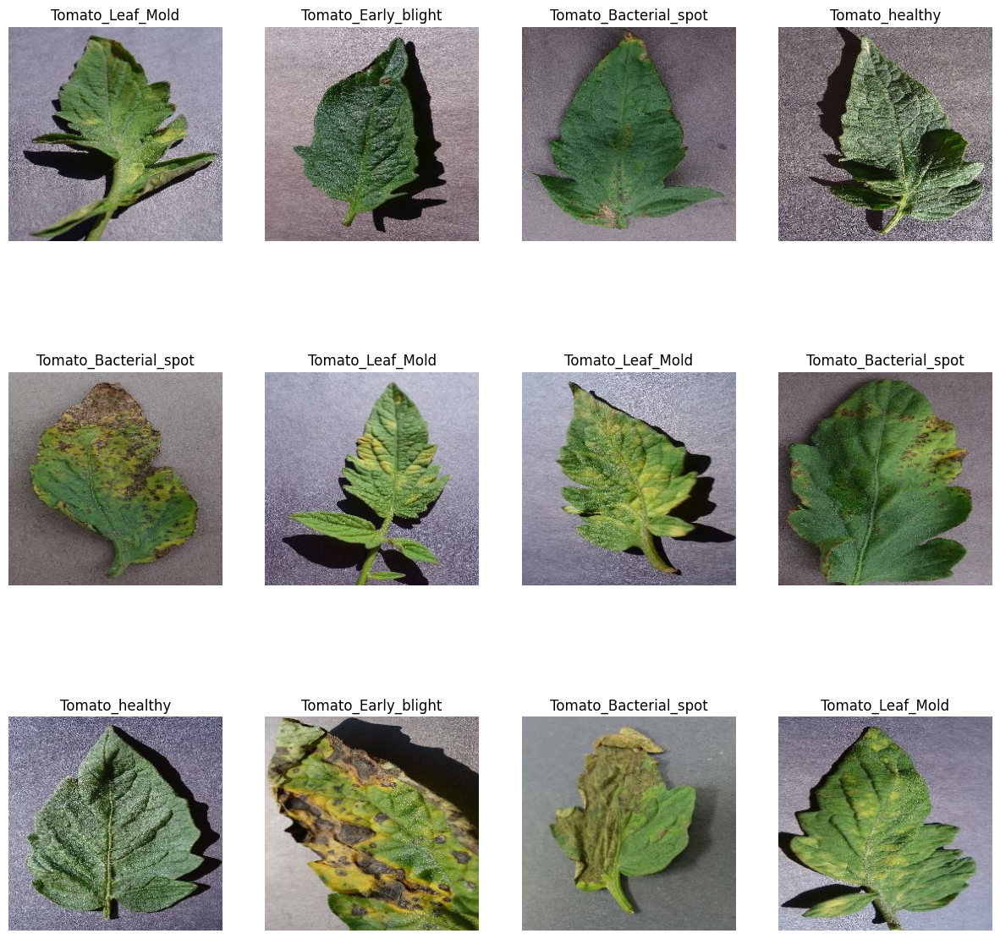

In [16]:
# Plotting the image
plt.figure(figsize = (15,15))
# dataset.take(count) : Creates a Dataset with at most 'count' elements(batch) from the dataset
for image, label in dataset.take(1): 
    for i in range(12):
        plt.subplot(3, 4, i+1) # many plots at a time =>subpots
        plt.imshow(image[i].numpy().astype('uint8')) #converting all data of image into numpy and than to intiger type as they were in float.
        plt.title(class_name[label[i]])  # title of the class_name of image
        plt.axis("off") # Hide the values of graph
        

In [17]:
# Function for Splitting the data
def split_dataset(ds, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=10000):
    
    if shuffle:
        ds = ds.shuffle(shuffle_size, seed = 10)
        
    ds_size = len(ds)
    train_size = int(train_split * ds_size)
    val_size = int(val_split * ds_size)
    
    train_ds = ds.take(train_size)
    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size).skip(val_size)
    
    return train_ds, val_ds, test_ds

In [18]:
train_data, val_data, test_data = split_dataset(dataset)

In [19]:
print("Size of Data is :{0} \nBatch size of Training Data is :{1}\nBatch size of Validation Data is :{2} \nBatch size of Testing Data is :{3} " .format(len(dataset), len(train_data), len(val_data), len(test_data)))

Size of Data is :151 
Batch size of Training Data is :120
Batch size of Validation Data is :15 
Batch size of Testing Data is :16 


In [20]:
# caching,shuffle and prefetching the data
train_ds = train_data.cache().shuffle(100).prefetch(buffer_size = tf.data.AUTOTUNE)
val_ds = val_data.cache().shuffle(100).prefetch(buffer_size = tf.data.AUTOTUNE)
test_ds = test_data.cache().shuffle(100).prefetch(buffer_size = tf.data.AUTOTUNE)

# Data Pre-processing 

In [21]:
# Image Preprocessing : Rescaling and Resizing
resize_and_rescale = tf.keras.Sequential([
    layers.experimental.preprocessing.Resizing(Image_Size, Image_Size),
    layers.experimental.preprocessing.Rescaling(1.0/255)
])

In [22]:
# Data augmentation by flipping and rotating existing images
data_augmentation = tf.keras.Sequential([
    layers.experimental.preprocessing.RandomFlip(mode="horizontal_and_vertical"),
    layers.experimental.preprocessing.RandomRotation(factor = 0.5)
])

# Model Building

In [23]:
# Creating Convolution layer 
input_shape = (Batch_Size, Image_Size, Image_Size, Channels)
model = models.Sequential([
    resize_and_rescale,
    data_augmentation,
    layers.Conv2D(filters = 16, kernel_size = (3,3), activation = 'relu', input_shape = input_shape),
    layers.MaxPool2D((2,2)),
    layers.Conv2D(64, (3,3), activation = 'relu'),
    layers.MaxPool2D((2,2)),
    layers.Conv2D(128, (3,3), activation = 'relu'),
    layers.MaxPool2D((2,2)),
    layers.Conv2D(64, (3,3), activation = 'relu'),
    layers.MaxPool2D((2,2)),
    layers.Conv2D(128, (3,3), activation = 'relu'),
    layers.MaxPool2D((2,2)),
    layers.Conv2D(64, (3,3), activation = 'relu'),
    layers.MaxPool2D((2,2)),
    layers.Flatten(),
    layers.Dense(128, activation = 'relu'),
    layers.Dense(64, activation = 'softmax'),

])


model.build(input_shape = input_shape)

In [24]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (32, 256, 256, 3)         0         
                                                                 
 sequential_1 (Sequential)   (32, 256, 256, 3)         0         
                                                                 
 conv2d (Conv2D)             (32, 254, 254, 16)        448       
                                                                 
 max_pooling2d (MaxPooling2D  (32, 127, 127, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (32, 125, 125, 64)        9280      
                                                                 
 max_pooling2d_1 (MaxPooling  (32, 62, 62, 64)         0         
 2D)                                                  

In [25]:
# Optimizing the model 'SparseCategoricalCrossentropy'=>as there are many categorical classes of data
model.compile(
    optimizer = 'adam', 
    loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits = False), 
    metrics = ['accuracy'])

In [26]:
#Fit the model with training data and also pass validation data
history = model.fit(train_data, epochs = 10, batch_size = Batch_Size , verbose = 1, validation_data = val_data)

Epoch 1/10


2023-04-08 05:39:32.191750: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [4814]
	 [[{{node Placeholder/_4}}]]
2023-04-08 05:39:32.192437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [4814]
	 [[{{node Placeholder/_0}}]]


120/120 [==============================] - ETA: 0s - loss: 1.7003 - accuracy: 0.2831

2023-04-08 05:40:50.017506: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [4814]
	 [[{{node Placeholder/_0}}]]
2023-04-08 05:40:50.018296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [4814]
	 [[{{node Placeholder/_4}}]]


120/120 [==============================] - 81s 603ms/step - loss: 1.7003 - accuracy: 0.2831 - val_loss: 1.4327 - val_accuracy: 0.3250
Epoch 2/10
120/120 [==============================] - 73s 603ms/step - loss: 1.2304 - accuracy: 0.5029 - val_loss: 1.1857 - val_accuracy: 0.5390
Epoch 3/10
120/120 [==============================] - 72s 598ms/step - loss: 0.7955 - accuracy: 0.6829 - val_loss: 0.8936 - val_accuracy: 0.6854
Epoch 4/10
120/120 [==============================] - 72s 598ms/step - loss: 0.6200 - accuracy: 0.7638 - val_loss: 1.0261 - val_accuracy: 0.6146
Epoch 5/10
120/120 [==============================] - 71s 587ms/step - loss: 0.5867 - accuracy: 0.7734 - val_loss: 0.8265 - val_accuracy: 0.7000
Epoch 6/10
120/120 [==============================] - 70s 575ms/step - loss: 0.4501 - accuracy: 0.8260 - val_loss: 0.5369 - val_accuracy: 0.8292
Epoch 7/10
120/120 [==============================] - 74s 614ms/step - loss: 0.4160 - accuracy: 0.8464 - val_loss: 0.9141 - val_accuracy: 0.7

In [27]:
scores = model.evaluate(train_data)

120/120 [==============================] - 17s 132ms/step - loss: 0.6706 - accuracy: 0.7899


In [28]:
scores = model.evaluate(test_data)

2023-04-08 05:52:25.832813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [4814]
	 [[{{node Placeholder/_4}}]]
2023-04-08 05:52:25.834591: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [4814]
	 [[{{node Placeholder/_4}}]]


16/16 [==============================] - 3s 148ms/step - loss: 0.6936 - accuracy: 0.7988


In [29]:
history

In [30]:
history.params

{'verbose': 1, 'epochs': 10, 'steps': 120}

In [31]:
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

# Analyzing the Output

In [32]:
# Getting the model history to analyse
train_loss = history.history['loss']
train_acc = history.history['accuracy']

val_loss = history.history['val_loss']
val_acc = history.history['val_accuracy']


Text(0.5, 1.0, 'Training and Validation Loss')

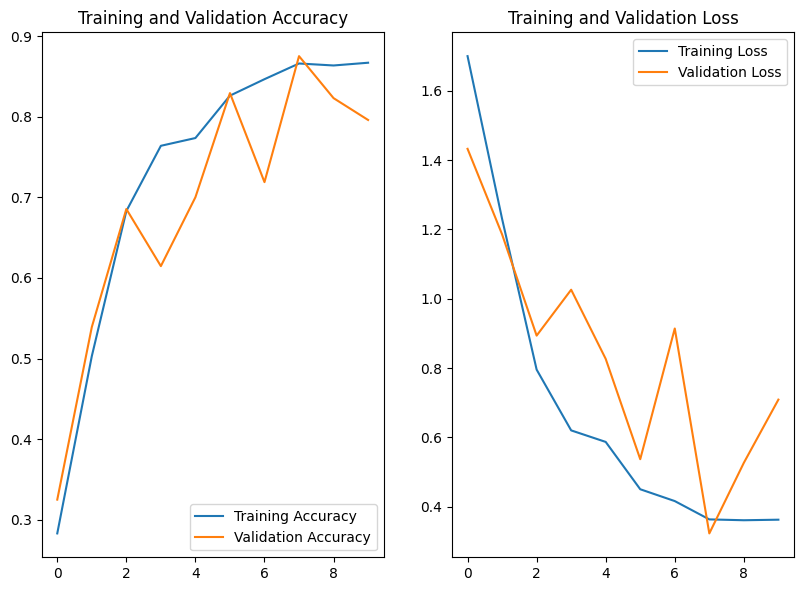

In [34]:
#graphs for accuracy and loss of training and validation data
plt.figure(figsize = (15,15))
plt.subplot(2,3,1)
plt.plot(range(10), train_acc, label = 'Training Accuracy')
plt.plot(range(10), val_acc, label = 'Validation Accuracy')
plt.legend(loc = 'lower right')
plt.title('Training and Validation Accuracy') 

plt.subplot(2,3,2)
plt.plot(range(10), train_loss, label = 'Training Loss')
plt.plot(range(10), val_loss, label = 'Validation Loss')
plt.legend(loc = 'upper right')
plt.title('Training and Validation Loss')

2023-04-08 05:53:17.601253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [4814]
	 [[{{node Placeholder/_4}}]]
2023-04-08 05:53:17.602065: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [4814]
	 [[{{node Placeholder/_4}}]]


First Image of batch to predict :
Actual label :  Tomato_Late_blight
1/1 [==============================] - 1s 520ms/step
Predicted label :  Tomato_Early_blight


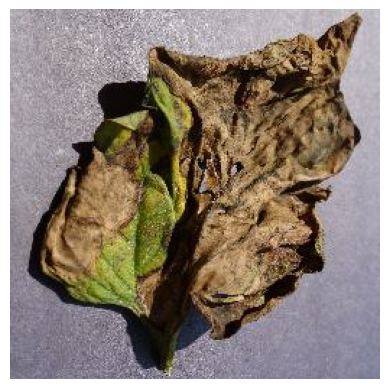

In [35]:
#plotting image
for batch_image, batch_label in train_data.take(1):
    first_image = batch_image[0].numpy().astype('uint8')
    first_label = class_name[batch_label[0]]
    
    print('First Image of batch to predict :')
    plt.imshow(first_image)
    print('Actual label : ', first_label)
    
    batch_prediction = model.predict(batch_image)
    print('Predicted label : ', class_name[np.argmax(batch_prediction[0])])
    plt.axis('off')

2023-04-08 05:53:19.226238: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [4814]
	 [[{{node Placeholder/_0}}]]
2023-04-08 05:53:19.227090: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [4814]
	 [[{{node Placeholder/_4}}]]


1/1 [==============================] - 0s 102ms/step


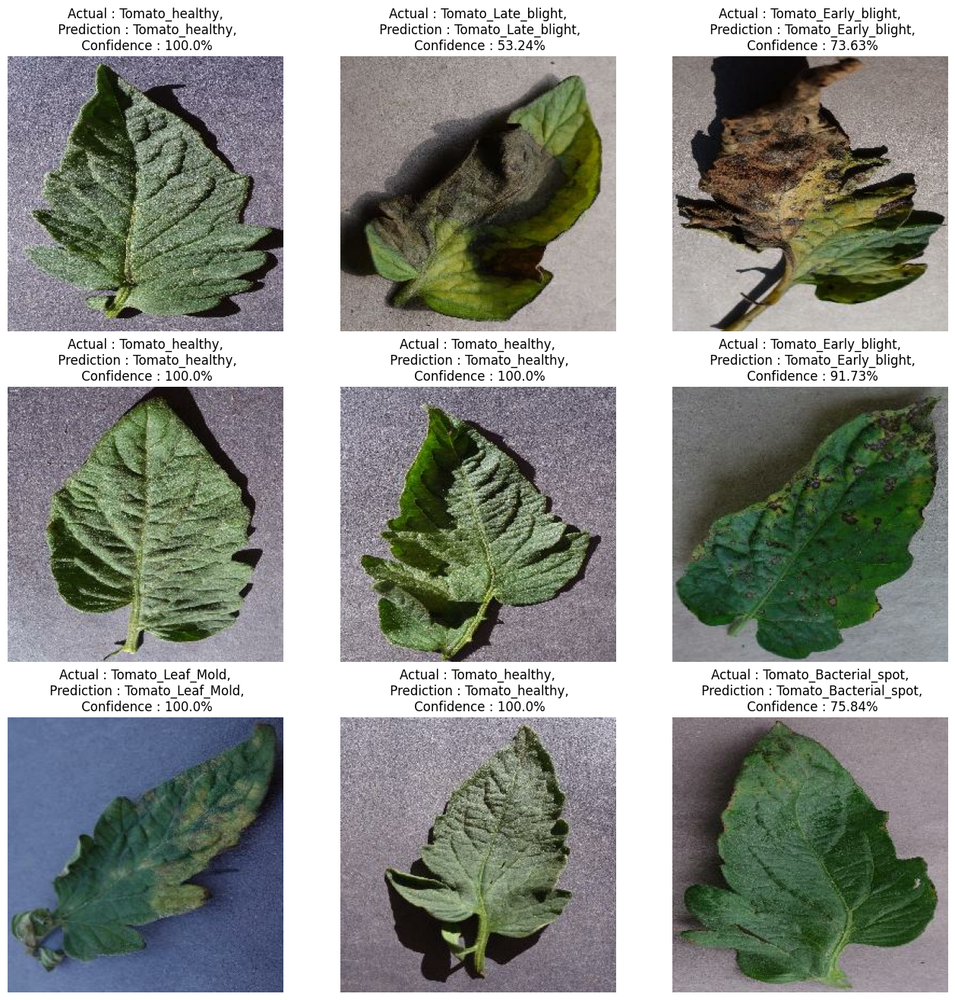

In [36]:
# plotting batch of images with its actual label, predicted label and confidence
plt.figure(figsize = (16,16))
for batch_image, batch_label in train_data.take(1):
    for i in range(9):
        ax = plt.subplot(3,3,i+1)
        image = batch_image[i].numpy().astype('uint8')
        label = class_name[batch_label[i]]
    
        plt.imshow(image)
    
        batch_prediction = model.predict(batch_image)
        predicted_class = class_name[np.argmax(batch_prediction[i])]
        confidence = round(np.max(batch_prediction[i]) * 100, 2)
        
        plt.title(f'Actual : {label},\n Prediction : {predicted_class},\n Confidence : {confidence}%')
    
        plt.axis('off')

2023-04-08 05:53:28.685820: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [4814]
	 [[{{node Placeholder/_0}}]]
2023-04-08 05:53:28.686581: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [4814]
	 [[{{node Placeholder/_4}}]]


1/1 [==============================] - 0s 99ms/step


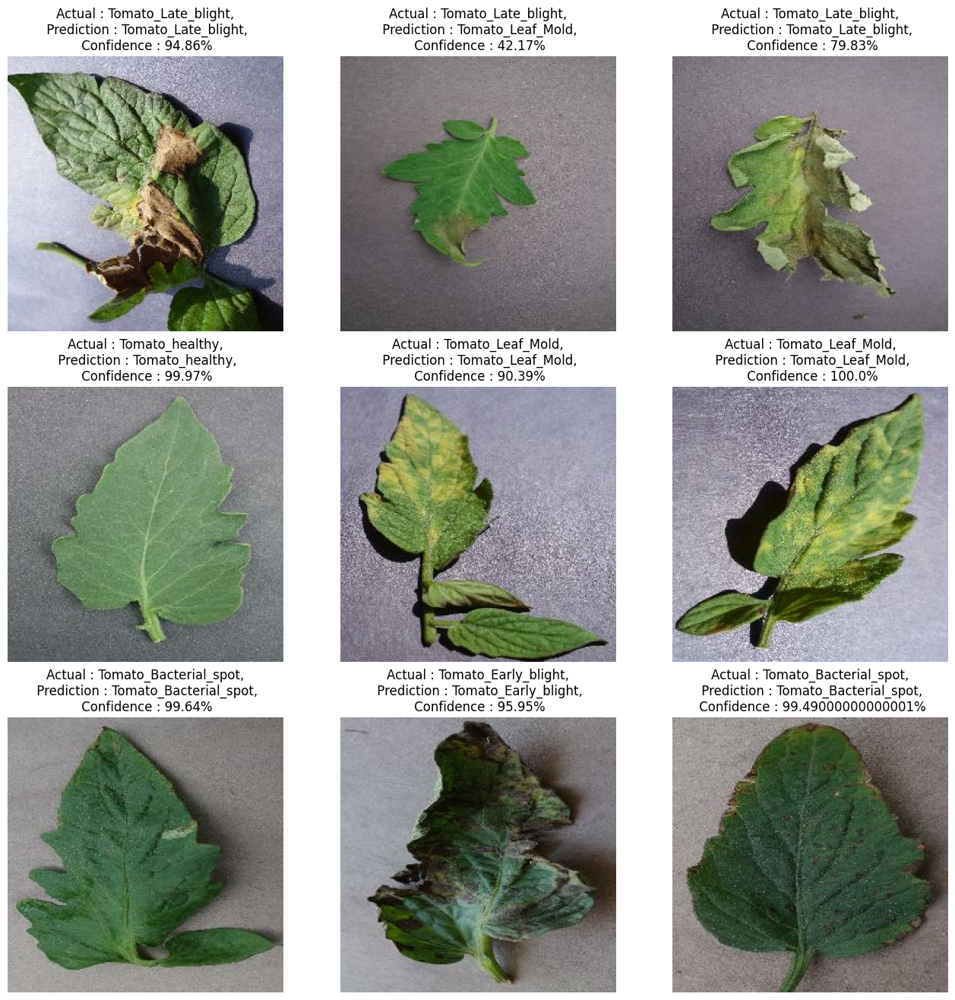

In [37]:
# plotting batch of images with its actual label, predicted label and confidence
plt.figure(figsize = (16,16))
for batch_image, batch_label in test_data.take(1):
    for i in range(9):
        ax = plt.subplot(3,3,i+1)
        image = batch_image[i].numpy().astype('uint8')
        label = class_name[batch_label[i]]
    
        plt.imshow(image)
    
        batch_prediction = model.predict(batch_image)
        predicted_class = class_name[np.argmax(batch_prediction[i])]
        confidence = round(np.max(batch_prediction[i]) * 100, 2)
        
        plt.title(f'Actual : {label},\n Prediction : {predicted_class},\n Confidence : {confidence}%')
    
        plt.axis('off')

2023-04-08 05:53:32.256630: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [4814]
	 [[{{node Placeholder/_0}}]]
2023-04-08 05:53:32.256986: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [4814]
	 [[{{node Placeholder/_4}}]]


1/1 [==============================] - 0s 103ms/step


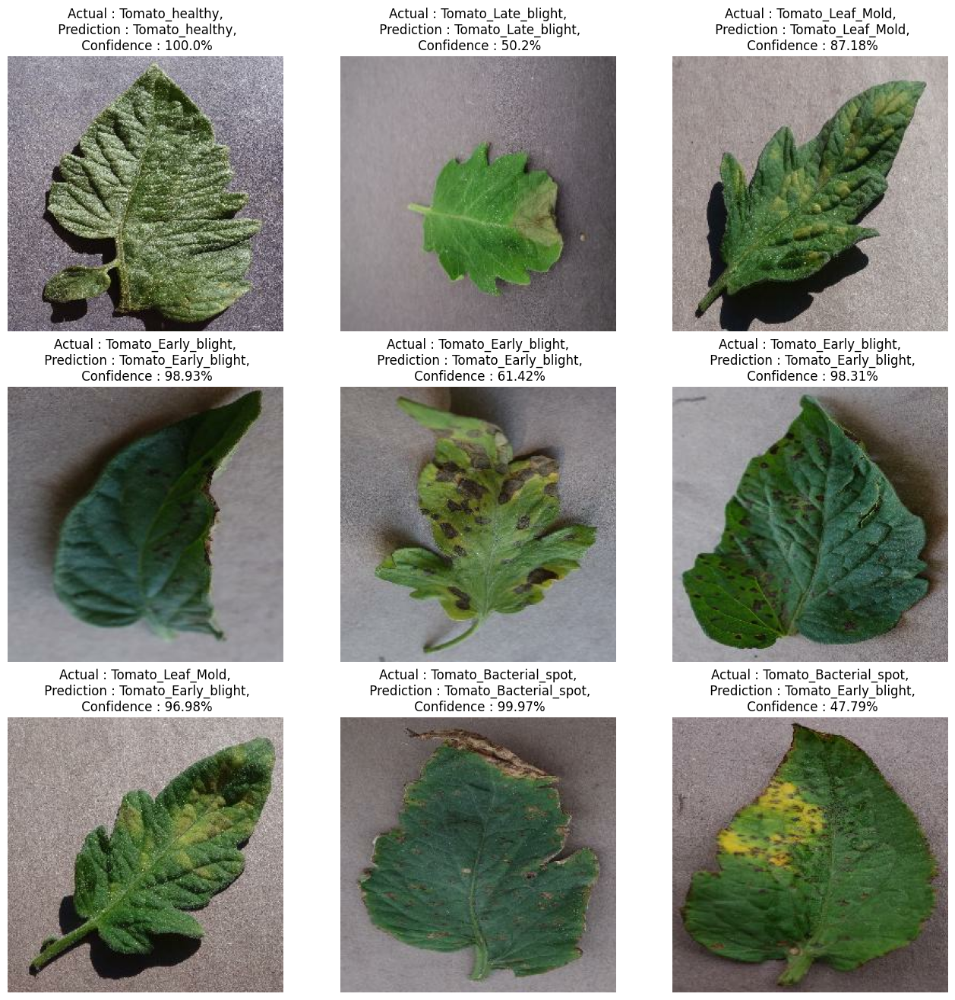

In [38]:
# plotting batch of images with its actual label, predicted label and confidence
plt.figure(figsize = (16,16))
for batch_image, batch_label in test_data.take(1):
    for i in range(9):
        ax = plt.subplot(3,3,i+1)
        image = batch_image[i].numpy().astype('uint8')
        label = class_name[batch_label[i]]
    
        plt.imshow(image)
    
        batch_prediction = model.predict(batch_image)
        predicted_class = class_name[np.argmax(batch_prediction[i])]
        confidence = round(np.max(batch_prediction[i]) * 100, 2)
        
        plt.title(f'Actual : {label},\n Prediction : {predicted_class},\n Confidence : {confidence}%')
    
        plt.axis('off')

In [39]:
# Save the model using TensorFlow SavedModel format
model.save('tomato.h5')

In [ ]:

This article was published as a part of the Data Science Blogathon

Introduction
In this article, We will develop an End to End project which will be based on Pure Deep Learning. I’m using Pure term here, the reason you’ll come to know in my further articles. The reason behind building this project is to detect or identify potato leaf diseases, having a variety of illnesses. Because our naked eyes can’t classify them, but Convolutional Neural Network can easily. You won’t believe it when I tell you that the error of some pre-trained Neural Network Architectures is approximately 3%, which is even less than the top 5% error of human vision. On large-scale images, the human top-5 error has been reported to be 5.1%, which is higher than pre-trained networks.

Problem Statement for Potato Leaf Disease Prediction
Farmers who grow potatoes suffer from serious financial standpoint losses each year which cause several diseases that affect potato plants. The diseases Early Blight and Late Blight are the most frequent. Early blight is caused by fungus and late blight is caused by specific micro-organisms and if farmers detect this disease early and apply appropriate treatment then it can save a lot of waste and prevent economical loss. The treatments for early blight and late blight are a little different so it’s important that you accurately identify what kind of disease is there in that potato plant. Behind the scene, we are going to use Convolutional Neural Network – Deep Learning to diagnose plant diseases.

Potato Leaf Disease Prediction Project Description
Here, we’ll develop an end-to-end Deep Learning project in the field of agriculture. We will create a simple Image Classification Model that will categorize Potato Leaf Disease using a simple and classic Convolutional Neural Network Architecture. We’ll start with collecting the data, then model building, and finally, we’ll use Streamlit to build a web-based application and deploy it on Heroku.

Let’s fire🔥
Potato Leaf Disease Prediction Data Collection
Any Data Science project start’s with the process of acquiring the data. First, we need to collect data. We have 3 options for collecting data first we can use readymade data we can either buy it from a third-party vendor or get it from Kaggle etc. The second option is we can have a team of Data Anatator whose job is to collect these images from farmers and annotate those images either healthy potato leaves or having early or late blight diseases. So this team of annotators works with farmers, go to the fields and they can ask farmers to take a photograph of leaves or they can take photographs themselves and they can classify them with the help of experts from agriculture field. So they can manually collect the data. But this process will be time-consuming. The third option is writing a web-scraping script to go through different websites which has potato images and collect those images and use different tools to annotate the data. In this project, I am using readymade data that I got from Kaggle.

Dataset Link: https://www.kaggle.com/abdallahalidev/plantvillage-dataset


Become a Full Stack Data Scientist
Transform into an expert and significantly impact the world of data science.
Potato Leaf Disease Prediction Data Loading
Our dataset must be in the following format.

Potato Leaf Dataset –> main folder
—-| train
—-| Potato_Healthy
—-| img1.jpg
—-| img2.jpg
—-| img3.jpg
—-| Potato_Early_Blight
—-| img1.jpg
—-| img2.jpg
—-| img3.jpg
—-| Potato_Late_Blight
—-| img1.jpg
—-| img2.jpg
—-| img3.jpg
—-| test
—-| Potato_Healthy
—-| img1.jpg
—-| img2.jpg
—-| img3.jpg
—-| Potato_Early_Blight
—-| img1.jpg
—-| img2.jpg
—-| img3.jpg
—-| Potato_Late_Blight
—-| img1.jpg
—-| img2.jpg
—-| img3.jpg
—-| valid
—-| Potato_Healthy
—-| img1.jpg
—-| img2.jpg
—-| img3.jpg
—-| Potato_Early_Blight
—-| img1.jpg
—-| img2.jpg
—-| img3.jpg
—-| Potato_Late_Blight
—-| img1.jpg
—-| img2.jpg
—-| img3.jpg
In this project, we are going to use only 900 images to train our model and 300 images for validation. As we all know, training a deep learning model requires a lot of data. To overcome this problem we will use one of the simple and effective methods, called Data Augmentation. Let’s first see what is data augmentation.

Data Augmentation: Data Augmentation is a process that generates several realistic variants of each training sample, to artificially expand the size of the training dataset. This aids in the reduction of overfitting. In data augmentation, we will slightly shift, rotate, and resize each image in the training set by different percentages, and then add all of the resulting photos to the training set. This allows the model to be more forgiving of changes in the object’s orientation, position, and size in the image. The contrast and lighting settings of the photographs can be changed. The images can be flipped horizontally and vertically. We may expand the size of our training set by merging all of the modifications.

Let’s begin the coding section
Installing the necessary libraries.
import numpy as np
import matplotlib.pyplot as plt
import glob
import cv2
import os
import matplotlib.image as mpimg
import random
from sklearn import preprocessing
import tensorflow.keras as keras
import tensorflow as tf
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical
Let’s now add some static variables to aid us in our progress.

SIZE = 256
SEED_TRAINING = 121
SEED_TESTING = 197
SEED_VALIDATION = 164
CHANNELS = 3
n_classes = 3
EPOCHS = 50
BATCH_SIZE = 16
input_shape = (SIZE, SIZE, CHANNELS)
To begin, we must first establish the setup for augmentation that we will use on our training dataset.

train_datagen = ImageDataGenerator(
        rescale = 1./255,
        rotation_range = 30,
        shear_range = 0.2,
        zoom_range = 0.2,
        width_shift_range=0.05,
        height_shift_range=0.05,
        horizontal_flip = True,
        fill_mode = 'nearest')
Here is one thing we need to care that, on validation and test dataset we will not use the same augmentation that we have used on the training dataset, because the validation and testing dataset will only test the performance of our model, and based on it, our model parameters or weights will get tunned. Our objective is to create a generalized and robust model, which we can achieve by training our model on a very large amount of dataset. That’s why here we are only applying data augmentation on the training dataset and artificially increasing the size of the training dataset.

validation_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale = 1./255)
Let’s now load the training, testing, and validation datasets from the directory and perform data augmentation on them.

Note that our data must be in the above-mentioned format. Otherwise, we might be able to get an error or our model’s performance may suffer. It will load our dataset from the directory first, then resize all of the images to the same dimension, make batches, and then choose RGB as the color mode.

train_generator = train_datagen.flow_from_directory(
        directory = '/content/Potato/Train/',  # this is the input directory
        target_size = (256, 256),  # all images will be resized to 64x64
        batch_size = BATCH_SIZE,
        class_mode = 'categorical',
        color_mode="rgb")
validation_generator = validation_datagen.flow_from_directory(
        '/content/Potato/Valid/',
        target_size = (256, 256),
        batch_size = BATCH_SIZE,
        class_mode='categorical',
        color_mode="rgb")
test_generator = test_datagen.flow_from_directory(
        '/content/Potato/Test/',
        target_size = (256, 256),
        batch_size = BATCH_SIZE,
        class_mode = 'categorical',
        color_mode = "rgb"
)
Let’s build a simple and classical Convolutional Neural Network Architecture now.

Our dataset is preprocessed and now we are ready to build our model. We are going to use a Convolutional Neural Network which is one of the famous types of Neural Network Architecture if you are solving Image Classification Problems. Here we are creating simple and classical Neural Network Architecture. Here we are using Keras Sequential API to create our model architecture, it only contains a stack of convolutional and pooling layers. There is approx n number of layers and then at the end, there is a dense layer where we just flatten our feature maps. In the end, we are using a dense layer with a softmax activation function, which will return the likelihood of each class.

model = keras.models.Sequential([
        keras.layers.Conv2D(32, (3,3), activation = 'relu', input_shape = input_shape),
        keras.layers.MaxPooling2D((2, 2)),
        keras.layers.Dropout(0.5),
        keras.layers.Conv2D(64, (3,3), activation = 'relu', padding = 'same'),
        keras.layers.MaxPooling2D((2,2)),
        keras.layers.Dropout(0.5),
        keras.layers.Conv2D(64, (3,3), activation = 'relu', padding = 'same'),
        keras.layers.MaxPooling2D((2,2)),
        keras.layers.Conv2D(64, (3,3), activation = 'relu', padding = 'same'),
        keras.layers.MaxPooling2D((2,2)),
        keras.layers.Conv2D(64, (3,3), activation = 'relu', padding = 'same'),
        keras.layers.MaxPooling2D((2,2)),
        keras.layers.Conv2D(64, (3,3), activation = 'relu', padding = 'same'),
        keras.layers.MaxPooling2D((2,2)),
        keras.layers.Flatten(),
        keras.layers.Dense(32, activation ='relu'),
        keras.layers.Dense(n_classes, activation='softmax')
    ])
I hope you are familiar that how the convolutional and Max pooling is working behind the scene. This architecture is hit & trial, you can try your architectures. You can experiment with different architecture by removing a few layers, adding more layers, and using dropouts. Now our model architecture is ready.

The next step is to investigate model architecture.

Let’s have a look at the brief summary of our model. We have a total of 185,667 trainable parameters. These are the weights we’ll be working with.

model.summary()
#-----------------------------Output-----------------------------
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
=================================================================
 conv2d (Conv2D)             (None, 254, 254, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 127, 127, 32)     0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 127, 127, 32)      0         
                                                                 
 conv2d_1 (Conv2D)           (None, 127, 127, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 63, 63, 64)       0         
 2D)                                                             
                                                                 
 dropout_1 (Dropout)         (None, 63, 63, 64)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 63, 63, 64)        36928     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 31, 31, 64)       0         
 2D)                                                             
                                                                 
 conv2d_3 (Conv2D)           (None, 31, 31, 64)        36928     
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 15, 15, 64)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 15, 15, 64)        36928     
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 7, 7, 64)         0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 7, 7, 64)          36928     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 3, 3, 64)         0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 576)               0         
                                                                 
 dense (Dense)               (None, 32)                18464     
                                                                 
 dense_1 (Dense)             (None, 3)                 99        
                                                                 
=================================================================
Total params: 185,667
Trainable params: 185,667
Non-trainable params: 0
_________________________________________________________________
Compile the Potato Leaf Disease Prediction model
model.compile(
    optimizer = 'adam',
    loss = tf.keras.losses.CategoricalCrossentropy(),
    metrics  = ['accuracy']
    )
We’re using Adam Optimizer, which is one of the most common optimizers, but you can also check out other optimizers. We’re using categorical cross-entropy in the loss because we’re dealing with a Multi-Class Classification problem. We’re using accuracy measures to track our model’s training performance

Train the network
history = model.fit_generator(
        train_generator,
        steps_per_epoch = train_generator.n // train_generator.batch_size,    #The 2 slashes division return rounded integer
        epochs = EPOCHS,
        validation_data = validation_generator,
        validation_steps = validation_generator.n // validation_generator.batch_size
        )
In the history parameter, we’re recording the history of each epoch so that we can create some charts to compare our model’s performance on the training and validation sets.

Let’s see how well the model performs on the test data.

Let’s test our model on the test dataset. Before putting our model into production, we must first test it on a test dataset to see how it performs.

score = model.evaluate_generator(test_generator)
print(‘Test loss : ‘, score[0])
print(‘Test accuracy : ‘, score[1])
 

————–OUTPUT—————–
Test Loss : 0.10339429974555969
Test Accuracy : 0.9733333587646484
On the test set, we have a 97% accuracy rate, which is rather good. Let’s start with some performance graphs.

Let’s have a look at the history parameter.

Actually, history is a Keras callback that keeps all epoch history as a list; let’s utilize it to plot some intriguing plots. Let’s start by putting all of these parameters into variables.

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')
plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()
Potato Leaf Disease Prediction VALIDATION
This graph shows the accuracy of training vs validation. Epochs are on the x-axis, and accuracy and loss are on the y-axis.

Let's save our model 
# it will save the model
model.save('final_model.h5')
Our model will be saved in HDF5 format since we need to save all learned parameters in deep learning, which might take up a lot of space, and HDF5 can easily hold a lot of data.

Streamlit – The Boom!
If you wanted to build a Machine Learning web application in the past, you had to use flask, Django, or hire a full stack developer, but when streamlit came along, it changed the entire ecosystem, allowing anyone to build a Machine Learning web application, Data Science web application, Data Science dashboard, or Data Analytics dashboard. Streamlit is a python library and a startup that allows you to construct web applications for free. It also offers Streamlit Cloud Services, where we can deploy our apps at different prices.

Streamlit is a free, open-source Python Framework, that allows us to quickly develop a Web Application without the requirement of a backend server and without having to write HTML, CSS, or Javascript. We can start building a really good Web Application simply by using our existing python skills. I’ve created a simple web application that accepts images as input and requires the same preprocessing steps on the input image as we did on our training dataset during training because when we save our model, it only saves model trained parameters, and we must preprocess our input manually, so this is something we must keep in mind when building any web application or using a pre-trained model.

Web App

# For potato leaf disease prediction
import streamlit as st
from PIL import Image
import numpy as np
import tensorflow.keras as keras
import matplotlib.pyplot as plt
import tensorflow_hub as hub

hide_streamlit_style = """
            
            #MainMenu {visibility: hidden;}
            footer {visibility: hidden;}
            
            """
st.markdown(hide_streamlit_style, unsafe_allow_html = True)

st.title('Potato Leaf Disease Prediction')

def main() :
    file_uploaded = st.file_uploader('Choose an image...', type = 'jpg')
    if file_uploaded is not None :
        image = Image.open(file_uploaded)
        st.write("Uploaded Image.")
        figure = plt.figure()
        plt.imshow(image)
        plt.axis('off')
        st.pyplot(figure)
        result, confidence = predict_class(image)
        st.write('Prediction : {}'.format(result))
        st.write('Confidence : {}%'.format(confidence))

def predict_class(image) :
    with st.spinner('Loading Model...'):
        classifier_model = keras.models.load_model(r'final_model.h5', compile = False)

    shape = ((256,256,3))
    model = keras.Sequential([hub.KerasLayer(classifier_model, input_shape = shape)])     # ye bhi kaam kar raha he
    test_image = image.resize((256, 256))
    test_image = keras.preprocessing.image.img_to_array(test_image)
    test_image /= 255.0
    test_image = np.expand_dims(test_image, axis = 0)
    class_name = ['Potato__Early_blight', 'Potato__Late_blight', 'Potato__healthy']

    prediction = model.predict(test_image)
    confidence = round(100 * (np.max(prediction[0])), 2)
    final_pred = class_name[np.argmax(prediction)]
    return final_pred, confidence

footer = """
a:link , a:visited{
    color: white;
    background-color: transparent;
    text-decoration: None;
}

a:hover,  a:active {
    color: red;
    background-color: transparent;
    text-decoration: None;
}

.footer {
    position: fixed;
    left: 0;
    bottom: 0;
    width: 100%;
    background-color: transparent;
    color: black;
    text-align: center;
}